## Load Data

In [6]:
#!pip install --quiet pandas_profiling

In [7]:
#!pip install --quiet xgboost

In [8]:
#! python3 -m pip install --quiet scikit-optimize

In [9]:
#! python3 -m pip install --quiet pycaret

In [10]:
#! pip install --quiet shap

In [11]:
import pandas as pd
import numpy as np
import pandas_profiling as pp
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
import xgboost
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.model_selection import cross_validate, train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.pipeline import Pipeline, FeatureUnion, make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.dummy import DummyClassifier
from sklearn.tree import DecisionTreeClassifier 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression 
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from skopt.plots import plot_objective, plot_histogram
from xgboost import XGBClassifier
from pycaret.classification import *

In [12]:
train = pd.read_csv('data/train.csv', index_col = 0)

## Exploratory Data Analysis

In [13]:
pp.ProfileReport(train)

In [14]:
## `is_business_travel_ready` is the same for all observations
print('is_business_travel_ready :', np.unique(train['is_business_travel_ready'])) 
train_df = train.drop(['is_business_travel_ready'], 1)

is_business_travel_ready : ['f']


In [15]:
print('\n minimum_nights > 10:', np.sum(train['minimum_nights']< 10) / len(train['minimum_nights']))

print('\n maximum_nights < 365:', np.sum(train['maximum_nights']> 365) / len(train['maximum_nights']))

print('\n bed_type: \n', train['bed_type'].value_counts())

print('\n require_guest_profile_picture: \n', train['require_guest_profile_picture'].value_counts())

print('\n require_guest_phone_verification: \n', train['require_guest_phone_verification'].value_counts())


 minimum_nights > 10: 0.9125090383224873

 maximum_nights < 365: 0.5195744241297386

 bed_type: 
 Real Bed         9641
Pull-out Sofa      23
Futon              12
Couch               3
Airbed              2
Name: bed_type, dtype: int64

 require_guest_profile_picture: 
 f    9454
t     227
Name: require_guest_profile_picture, dtype: int64

 require_guest_phone_verification: 
 f    9493
t     188
Name: require_guest_phone_verification, dtype: int64


- There are no missing values in the training set.
- `is_business_travel_ready` is the same for all observations, so it cannot provide any information for the price. I choose to remove it. 
- The distributions of `minimum_nights` and `maximum_nights` are highly skewed. There are over 90% of Airbnb properties whose minimum nights stay is less than 10 days. However, there are over 50% of Airbnb properties whose maximum nights stay is more than a year.
- Over 99% of `bed_type` is the same, indicating that this feature may not provide much information about the price.
- Over 97% of `require_guest_profile_picture` is the same, indicating that this feature may not provide much information about the price.
- Over 98% of `require_guest_phone_verification` is the same, indicating that this feature may not provide much information about the price.
- `require_guest_profile_picture` and `require_guest_phone_verification` are highly correlated. Because owners who need verification are often more cautious, those require phone verification are likely to require photo verification at the same time.
- `bedrooms`, `beds` and `bathrooms` are highly correlated. The number of beds has traditionally been a more high priority search parameter on Airbnb, as it is more relevant for the number of people accommodated than the number of bedrooms (and is still the second highest priority parameter when searching on the site. In addition, `guests_included` is correlated with these three variables.
- `number_of_reviews` and `reviews_per_month` are highly correlated. This is reasonable because the latter is the "average value" of the former.
- Surprisingly, `maximum_nights` and `room_type` are highly correlated. Maybe it's because customers prefer to stay in private rooms longer.
- From the correlation plots, it seems that `room_type`, `bathrooms`, `bedrooms`, `beds`, `cleaning_fee`, `guests_included`, and `neighbourhood` are influencing factors. 

## Data Preprocessing

#### `host_since`

This is a datetime column and should be converted into a metric that measures the number of days the host has been on the platform. I used today (November 5, 2020) to calculate this metric. 

In [16]:
train_df.host_since

id
727        8/1/13
6274      2/14/14
6025     10/19/17
8931       2/1/19
7524      1/24/15
           ...   
11933     6/26/19
10678     6/12/11
13466     5/26/14
2931       5/4/16
6378      3/21/16
Name: host_since, Length: 9681, dtype: object

In [17]:
# convert to datetime
train_df.host_since = pd.to_datetime(train_df.host_since) 

# calculate the number of days between the date that the host first joined Airbnb and today
train_df['host_days_active'] = (datetime(2020, 11, 5) - train_df.host_since).astype('timedelta64[D]')
train_df = train_df.drop('host_since', 1)

#### `last_review`

In [18]:
# convert to datetime
train_df.last_review = pd.to_datetime(train_df.last_review)

# Calculate the number of days between the last review and today
train_df['time_since_last_review'] = (datetime(2020, 11, 5) - train_df.last_review).astype('timedelta64[D]')
train_df = train_df.drop('last_review', 1)

#### `cancellation_policy`

In [19]:
train_df['cancellation_policy'].value_counts()

strict_14_with_grace_period    3396
flexible                       3160
moderate                       3096
super_strict_30                  26
super_strict_60                   3
Name: cancellation_policy, dtype: int64

Since the super strict options are only available to long-term Airbnb hosts and is invitation only, it is clear that the super strict options are stricter than "strict_14_with_grace_period". As the number of "super strict" is too small, I choose to combine it with "strict_14_with_grace_period" after EDA.

#### `bed_type`

In [20]:
train_df['bed_type'].value_counts()

Real Bed         9641
Pull-out Sofa      23
Futon              12
Couch               3
Airbed              2
Name: bed_type, dtype: int64

Similarly, I will convert `Couch` and `Airbed` into `other` after EDA.

#### `require_guest_phone_verification` and `require_guest_profile_picture`

In [21]:
train_df.groupby(by = 'require_guest_profile_picture').agg({'price': ['mean', 'median']})

price       
                                   mean median
require_guest_profile_picture                 
f                              2.486461      2
t                              2.889868      3

In [22]:
train_df.groupby(by = 'require_guest_phone_verification').agg({'price': ['mean', 'median']})

price       
                                      mean median
require_guest_phone_verification                 
f                                 2.488781      2
t                                 2.856383      3

Since `require_guest_phone_verification` and `require_guest_profile_picture` are highly correlated, and the mean and median prices for these two variables are very similar, we can simply drop one of them. I might drop `require_guest_profile_picture` after EDA because I think phone verification is more strict.

## Data Visualization

#### Binary Variable

In [23]:
def plot_categorical(par_name, ax, rename = None):
    df = train_df.groupby(by = ['price', par_name]).count().unstack(fill_value=0).stack().mean(axis=1)
    ind = df.unstack().columns
    
    p1 = ax.bar(ind, np.array(df.iloc[len(ind)*0:len(ind)*0+len(ind)]))
    p2 = ax.bar(ind, np.array(df.iloc[len(ind)*1:len(ind)*1+len(ind)]), bottom=np.array(df.iloc[len(ind)*0:len(ind)*0+len(ind)]))
    p3 = ax.bar(ind, np.array(df.iloc[len(ind)*2:len(ind)*2+len(ind)]), bottom=np.array(df.iloc[len(ind)*1:len(ind)*1+len(ind)]) + np.array(df.iloc[len(ind)*0:len(ind)*0+len(ind)]))
    p4 = ax.bar(ind, np.array(df.iloc[len(ind)*3:len(ind)*3+len(ind)]), bottom=np.array(df.iloc[len(ind)*2:len(ind)*2+len(ind)]) + np.array(df.iloc[len(ind)*1:len(ind)*1+len(ind)]) + np.array(df.iloc[len(ind)*0:len(ind)*0+len(ind)]))

    ax.set_title(f'Prices by {par_name}')
    ax.set_xticks(ind)
    if rename is None:
        ax.set_xticklabels(df.iloc[len(ind)*i:len(ind)*i+len(ind)].unstack().columns)
    else:
        ax.set_xticklabels(rename)
    ax.legend((p1[0], p2[0], p3[0], p4[0]), df.unstack().index)

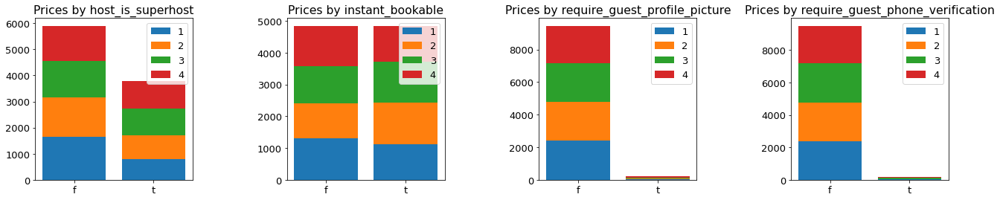

In [24]:
binary = ['host_is_superhost', 'instant_bookable', 'require_guest_profile_picture', 'require_guest_phone_verification']

plt.rcParams.update({'font.size': 13})
fig, axs = plt.subplots(nrows=1, ncols=len(binary), figsize=(22, 4))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None,
                wspace=0.6)
for i in range(len(binary)):
    plot_categorical(binary[i], axs[i])

#### Categorical Variable

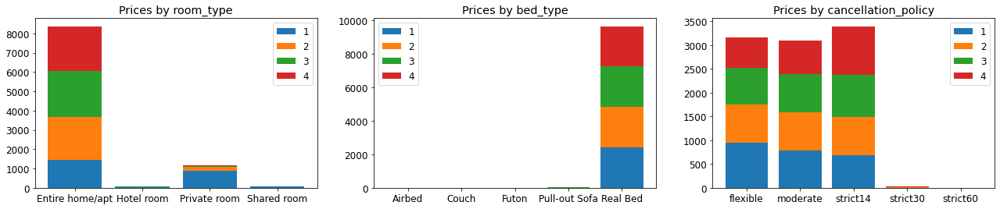

In [25]:
categorical = ['room_type', 'bed_type', 'cancellation_policy']

plt.rcParams.update({'font.size': 12})
fig, axs = plt.subplots(nrows=1, ncols=len(categorical), figsize=(22, 4))
for i in range(len(categorical)):
    if i == 2:
        plot_categorical(categorical[i], axs[i], rename = ['flexible', 'moderate', 'strict14', 'strict30', 'strict60'])
    else:
        plot_categorical(categorical[i], axs[i])

#### `neighbourhood`

In [26]:
train_df['neighbourhood'].value_counts()

Palermo                3302
Recoleta               1661
San Nicolás             595
Retiro                  495
Belgrano                416
Monserrat               390
San Telmo               389
Almagro                 379
Balvanera               365
Villa Crespo            310
Colegiales              183
Núñez                   175
Chacarita               168
Caballito               143
Puerto Madero           112
Villa Urquiza            84
Barracas                 58
Constitución             57
Saavedra                 41
La Boca                  39
Boedo                    35
Flores                   30
Coghlan                  28
Villa Ortúzar            26
Parque Patricios         24
Villa Devoto             22
San Cristóbal            19
Villa del Parque         19
Parque Chacabuco         18
Parque Chas              17
Agronomía                15
Villa General Mitre      10
Villa Pueyrredón          9
Liniers                   8
Floresta                  6
Vélez Sársfield     

In [27]:
train_df.groupby(by = 'neighbourhood').agg({'price': ['mean', 'median', 'std']})

price                 
                         mean median       std
neighbourhood                                 
Agronomía            2.066667    2.0  0.961150
Almagro              1.849604    2.0  0.968317
Balvanera            1.939726    2.0  1.003666
Barracas             2.120690    2.0  1.185846
Belgrano             2.413462    2.0  1.124625
Boedo                1.685714    1.0  0.900047
Caballito            1.860140    2.0  0.946464
Chacarita            2.303571    2.0  1.109345
Coghlan              2.035714    2.0  0.961563
Colegiales           2.371585    2.0  1.070925
Constitución         1.877193    2.0  0.825274
Flores               1.533333    1.0  0.899553
Floresta             2.333333    2.0  1.366260
La Boca              2.000000    2.0  1.076055
La Paternal          1.750000    1.0  1.500000
Liniers              1.750000    1.5  0.886405
Mataderos            1.333333    1.0  0.577350
Monserrat            2.243590    2.0  1.091989
Monte Castro         1.000000    1.0  0.000000
Nueva Pompeya        2.500000    2.5  2.121320
Núñez                2.302857    2.0  1.069291
Palermo              2.792550    3.0  1.056550
Parque Avellaneda    1.000000    1.0  0.000000
Parque Chacabuco     1.888889    1.0  1.182663
Parque Chas          1.588235    1.0  1.003670
Parque Patricios     1.666667    1.0  0.916831
Puerto Madero        3.553571    4.0  0.878566
Recoleta             2.685129    3.0  1.094434
Retiro               2.602020    3.0  1.084112
Saavedra             1.926829    2.0  1.009709
San Cristóbal        2.052632    2.0  1.177270
San Nicolás          2.265546    2.0  1.046112
San Telmo            2.421594    2.0  1.103951
Versalles            2.500000    2.5  0.707107
Villa Crespo         1.951613    2.0  0.982491
Villa Devoto         2.090909    1.5  1.269011
Villa General Mitre  1.200000    1.0  0.421637
Villa Luro           1.166667    1.0  0.408248
Villa Ortúzar        1.500000    1.0  0.905539
Villa Pueyrredón     2.000000    2.0  1.000000
Villa Real           2.000000    2.0  1.414214
Villa Santa Rita     1.750000    1.5  0.957427
Villa Urquiza        2.000000    2.0  0.905139
Villa del Parque     1.947368    2.0  0.970320
Vélez Sársfield      2.000000    1.5  1.264911

#### Numerical variable

In [28]:
def plot_numerical(par_name, ax):
    df=train_df[['price', par_name]]
    
    df.boxplot(column = par_name, by = 'price', ax = ax)
    title_boxplot = f'Prices by {par_name}'
    ax.set_title(title_boxplot)
    ax.set_ylabel(par_name)

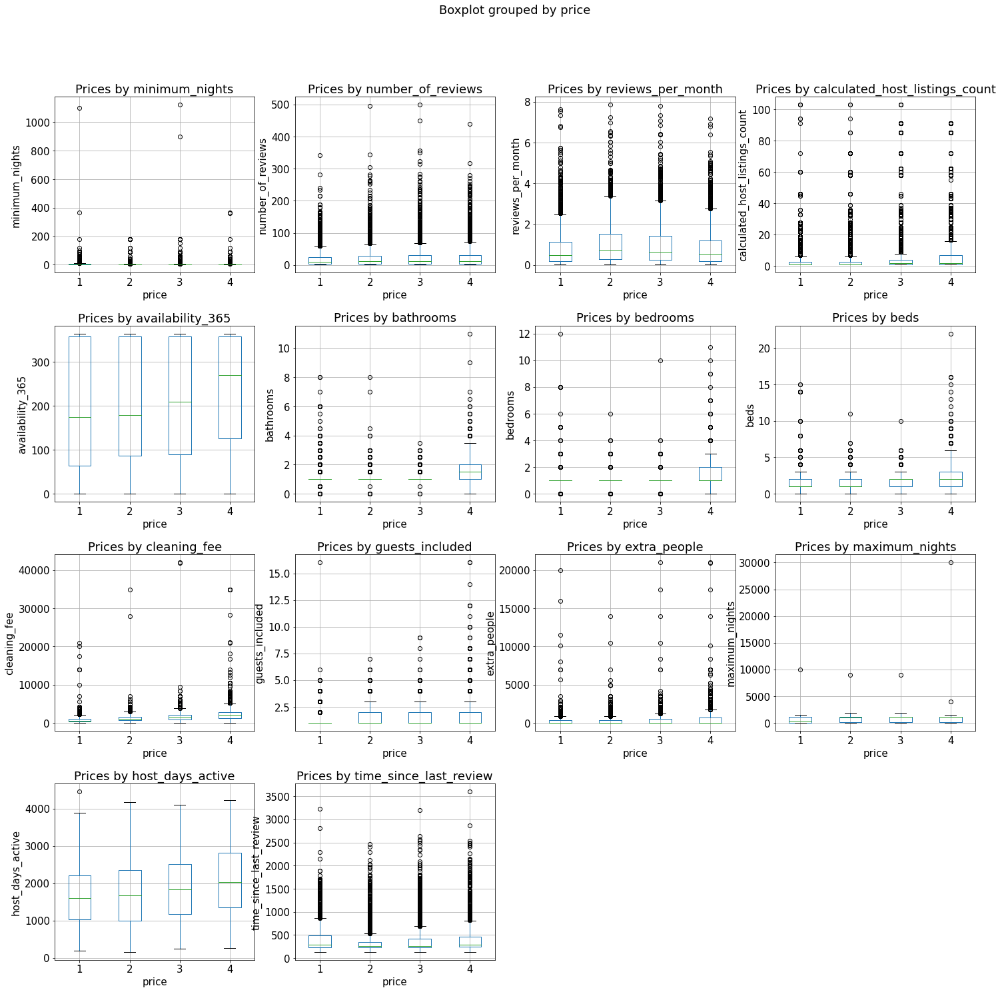

In [29]:
numerical = np.delete(np.array(train_df._get_numeric_data().columns), 
                      np.where(np.array(train_df._get_numeric_data().columns) == 'price'))

plt.rcParams.update({'font.size': 15})
fig, axs = plt.subplots(nrows=4, ncols=len(numerical) // 4 + 1, figsize=(24, 24))
fig.suptitle('My Own Title',backgroundcolor='white', color='black')
plt.subplots_adjust(left=None, bottom=None, right=None, top=None,
                wspace=0.6, hspace=0.3)
axs[3,2].set_axis_off()
axs[3,3].set_axis_off()
for i in range(len(numerical)):
    plot_numerical(numerical[i], axs[i // 4, i % 4])

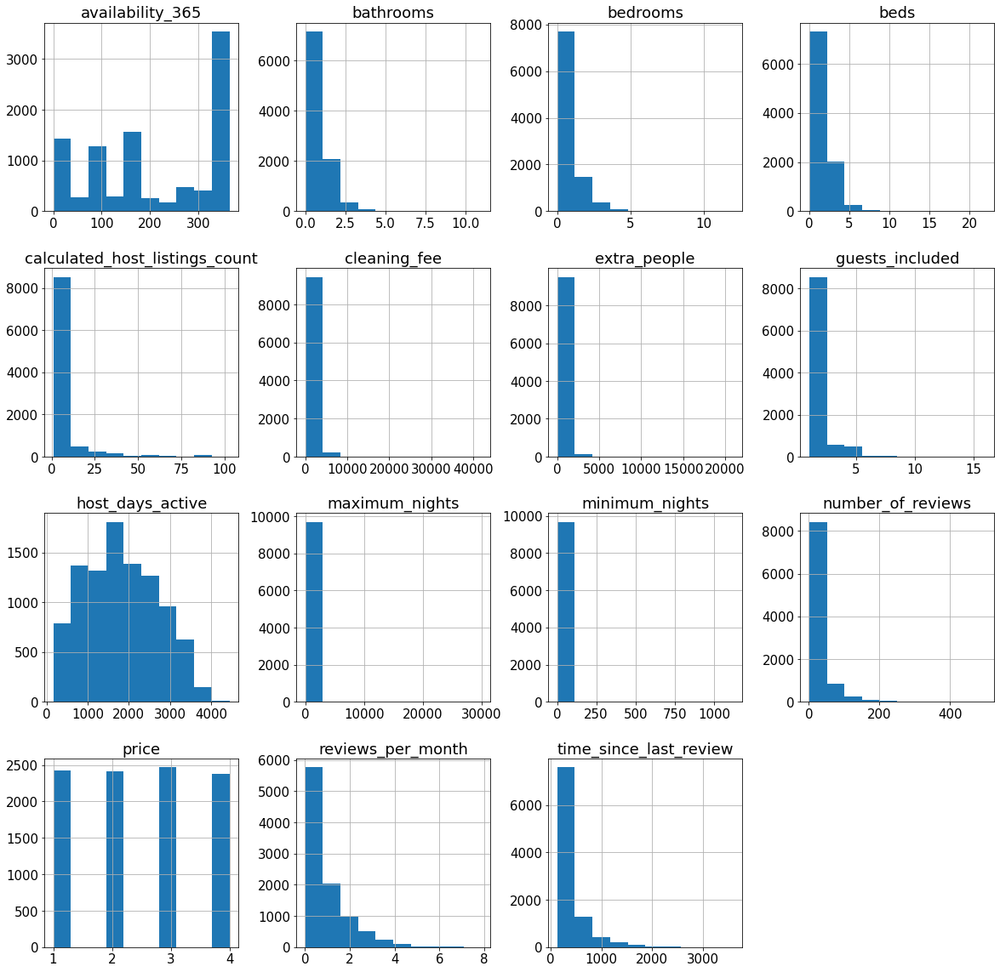

In [30]:
train_df._get_numeric_data().hist(figsize=(20,20));

## Prepare the data for modeling

In [31]:
## bed_type
bed_others = ['Couch', 'Airbed']
bed_keep = list(set(train_df.bed_type) - set(bed_others))
train_df.loc[~train_df.bed_type.isin(bed_keep), 'bed_type'] = 'other'

## neighbourhood
#other = ['Vélez Sársfield', 'Villa Real', 'Mataderos']
#train_df = train_df.loc[~train_df.neighbourhood.isin(other)]
other = ['Vélez Sársfield', 'Floresta', 'Villa Luro', 'La Paternal', 'Villa Santa Rita', 'Mataderos', 'Villa Real', 'Monte Castro', 'Versalles', 'Parque Avellaneda',  'Nueva Pompeya']
keep = list(set(train_df.neighbourhood) - set(other))
train_df.loc[~train_df.neighbourhood.isin(keep), 'neighbourhood'] = 'other'

# Replacing cancellation_policy categories
train_df.cancellation_policy.replace({
    'super_strict_30': 'strict_14_with_grace_period',
    'super_strict_60': 'strict_14_with_grace_period'
    }, inplace=True)

## require_guest_profile_picture
train_df = train_df.drop(['require_guest_profile_picture'], 1)

## instant_bookable
train_df = train_df.drop('instant_bookable', 1)

## number_of_reviews
#train_df = train_df.drop('number_of_reviews', 1)

### check data type

In [32]:
len(train_df.columns)

21

In [33]:
train_df.dtypes

neighbourhood                        object
room_type                            object
minimum_nights                        int64
number_of_reviews                     int64
reviews_per_month                   float64
calculated_host_listings_count        int64
availability_365                      int64
host_is_superhost                    object
bathrooms                           float64
bedrooms                              int64
beds                                  int64
bed_type                             object
cleaning_fee                          int64
guests_included                       int64
extra_people                          int64
maximum_nights                        int64
cancellation_policy                  object
require_guest_phone_verification     object
price                                 int64
host_days_active                    float64
time_since_last_review              float64
dtype: object

## Modeling

In [34]:
X = train_df.drop('price', axis=1)
y = train_df.price

#### Seperate train and test data

In [35]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

#### Standardize data

The data has both numeric and categorical variables, and I want to standardize the numeric variables but leave the dummies as they are.

In [36]:
numeric = np.array(X_train._get_numeric_data().columns)
categorical = np.delete(X_train.columns, np.isin(np.array(X_train.columns), numeric))

## standardize numeric features -- on my training set
X_train_categorical = pd.get_dummies(X_train[categorical])
scaler = StandardScaler()
X_train_numeric = pd.DataFrame(data=scaler.fit_transform(X_train[numeric]), columns=numeric, index = X_train_categorical.index)
X_train_std = pd.concat([X_train_numeric, X_train_categorical], axis=1, sort=False)

## standardize numeric features -- on my test set
X_test_categorical = pd.get_dummies(X_test[categorical])
X_test_numeric = pd.DataFrame(data=scaler.transform(X_test[numeric]), columns=numeric, index = X_test_categorical.index)
X_test_std = pd.concat([X_test_numeric, X_test_categorical], axis=1, sort=False)

In [37]:
## standardize numeric features -- on the whole training set
X_categorical = pd.get_dummies(X[categorical])
X_numeric = pd.DataFrame(data=scaler.transform(X[numeric]), columns=numeric, index = X_categorical.index)
X_std = pd.concat([X_numeric, X_categorical], axis=1, sort=False)

### Try many classification models using `pycaret`

`pycaret` presents a nice API that automates most of the boilerplate work in setting up a machine learning pipeline.

In [38]:
# load data
data = X_train_std.copy()
data['price'] = y_train

test = X_test_std.copy()
test['price'] = y_test

In [39]:
clfs = setup(
    data = data, 
    target = 'price',
    silent=True, 
    session_id=0, ## random_state
    preprocess = False, ## I have done data preprocessing
    fold_strategy = 'kfold',
    test_data = test,
);

,Description,Value
0,session_id,0
1,Target,price
2,Target Type,Multiclass
3,Label Encoded,"1: 0, 2: 1, 3: 2, 4: 3"
4,Original Data,"(6776, 65)"
5,Missing Values,False
6,Numeric Features,64
7,Categorical Features,0
8,Transformed Train Set,"(6776, 64)"
9,Transformed Test Set,"(2905, 64)"


The first step is to train all the models in the model library (sklearn, etc.) using default hyperparameters and evaluates performance metrics using cross validation. It returns the trained model object. Here, I use "Accuracy" as evaluation metric. 

The output of the function is a table showing averaged score of all models across the folds. By default, the number of folds is set to 10. The table is sorted (highest to lowest) by the metric of choice. 

In [40]:
top = compare_models(sort = 'Accuracy', n_select = 10)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.5403,0.7933,0.5420,0.5485,0.5432,0.3862,0.3868,0.2220
lightgbm,Light Gradient Boosting Machine,0.5331,0.7919,0.5346,0.5410,0.5359,0.3765,0.3771,0.1240
catboost,CatBoost Classifier,0.5319,0.7894,0.5337,0.5366,0.5334,0.3750,0.3754,3.8960
xgboost,Extreme Gradient Boosting,0.5298,0.7888,0.5310,0.5381,0.5328,0.3721,0.3726,1.4100
gbc,Gradient Boosting Classifier,0.5283,0.7844,0.5301,0.5396,0.5323,0.3702,0.3710,0.6510
et,Extra Trees Classifier,0.5252,0.7753,0.5270,0.5309,0.5271,0.3663,0.3667,0.1620
ada,Ada Boost Classifier,0.4993,0.7371,0.5012,0.5045,0.5009,0.3315,0.3320,0.0590
lr,Logistic Regression,0.4907,0.7564,0.4929,0.5011,0.4942,0.3202,0.3209,0.1920
lda,Linear Discriminant Analysis,0.4824,0.7474,0.4836,0.5232,0.4921,0.3084,0.3124,0.0200
ridge,Ridge Classifier,0.4777,0.0000,0.4805,0.4832,0.4780,0.3034,0.3043,0.0730


### Check each model

#### RF

In [41]:
rfc = RandomForestClassifier()

In [42]:
params1 = {
    'criterion': ['gini', 'entropy'],
    'n_estimators': [50, 100, 200, 300, 400, 500],
}

print('the number of parameter combinations: ', np.prod(list(map(len, params1.values()))))

the number of parameter combinations:  12


In [43]:
clf_gs = GridSearchCV(
    rfc, 
    params1, 
    n_jobs=-1, 
    cv = 10,
)
clf_gs.fit(X_train_std, y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rand

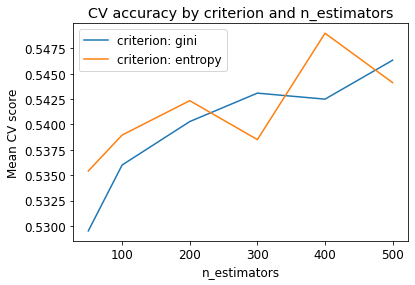

In [44]:
plt.rcParams.update({'font.size': 12})
scores = clf_gs.cv_results_['mean_test_score']
scores = np.array(scores).reshape(len(params1['criterion']), len(params1['n_estimators']))

for ind, i in enumerate(params1['criterion']):
    plt.plot(params1['n_estimators'], scores[ind], label='criterion: ' + str(i))
plt.legend()
plt.xlabel('n_estimators')
plt.ylabel('Mean CV score')
plt.title('CV accuracy by criterion and n_estimators')
plt.show()

In [45]:
clf_gs.best_estimator_

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=400,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [46]:
optimised_random_forest = clf_gs.best_estimator_
print("CV Accuracy: %.2f%%" % (np.mean(cross_val_score(optimised_random_forest, X_train_std, y_train, cv=10)) * 100.0))
print("Out-of-sample Accuracy: %.2f%%" % (optimised_random_forest.score(X_test_std, y_test) * 100.0))

CV Accuracy: 54.34%
Out-of-sample Accuracy: 55.15%


##### Fit the classifier on the whole training set

In [47]:
%%time
optimised_random_forest.fit(X_std, y)

CPU times: user 10.6 s, sys: 6.71 ms, total: 10.6 s
Wall time: 10.6 s


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=400,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

#### Gradient Boosting Classifier

In [48]:
bc = GradientBoostingClassifier()

In [49]:
params2 = {
    'learning_rate': [0.001, 0.01, 0.1, 1],
    'n_estimators': [50, 100, 200, 300, 400, 500],
}

print('the number of parameter combinations: ', np.prod(list(map(len, params2.values()))))

the number of parameter combinations:  24


In [50]:
clf_gs = GridSearchCV(
    bc, 
    params2, 
    n_jobs=-1, 
    cv = 10,
)
clf_gs.fit(X_train_std, y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=GradientBoostingClassifier(ccp_alpha=0.0,
                                                  criterion='friedman_mse',
                                                  init=None, learning_rate=0.1,
                                                  loss='deviance', max_depth=3,
                                                  max_features=None,
                                                  max_leaf_nodes=None,
                                                  min_impurity_decrease=0.0,
                                                  min_impurity_split=None,
                                                  min_samples_leaf=1,
                                                  min_samples_split=2,
                                                  min_weight_fraction_leaf=0.0,
                                                  n_estimators=100,
                                                  n_iter_no_change=None,
        

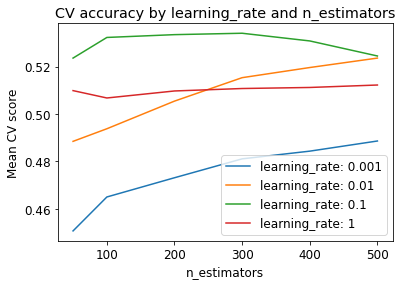

In [51]:
scores = clf_gs.cv_results_['mean_test_score']
scores = np.array(scores).reshape(len(params2['learning_rate']), len(params2['n_estimators']))

for ind, i in enumerate(params2['learning_rate']):
    plt.plot(params2['n_estimators'], scores[ind], label='learning_rate: ' + str(i))
plt.legend()
plt.xlabel('n_estimators')
plt.ylabel('Mean CV score')
plt.title('CV accuracy by learning_rate and n_estimators')
plt.show()

In [52]:
clf_gs.best_estimator_

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=300,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [53]:
optimised_gradient_boosting = clf_gs.best_estimator_
print("CV Accuracy: %.2f%%" % (np.mean(cross_val_score(optimised_gradient_boosting, X_train_std, y_train, cv=10)) * 100.0))
print("Out-of-sample Accuracy: %.2f%%" % (optimised_gradient_boosting.score(X_test_std, y_test) * 100.0))

CV Accuracy: 53.31%
Out-of-sample Accuracy: 54.70%


##### Fit the classifier on the whole training set

In [54]:
%%time
optimised_gradient_boosting.fit(X_std, y)

CPU times: user 26 s, sys: 0 ns, total: 26 s
Wall time: 26 s


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=300,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

#### XGBoost

In [55]:
xgbc = XGBClassifier()

In [56]:
params3 = {
    'learning_rate': [0.001, 0.01, 0.1, 1],
    'n_estimators': [50, 100, 200],
}

print('the number of parameter combinations: ', np.prod(list(map(len, params3.values()))))

the number of parameter combinations:  12


In [58]:
scores = [] 
kf = KFold(n_splits=10)
for i in range(np.prod(list(map(len, params3.values())))):
    s = []
    for train_index, test_index in kf.split(X_train_std):
        classifier = XGBClassifier(n_estimators = params3['n_estimators'][i % 3], learning_rate = params3['learning_rate'][i // 3])
        XX_train, XX_test = X_train_std.iloc[train_index, :], X_train_std.iloc[test_index, :]
        yy_train, yy_test = y_train.iloc[train_index], y_train.iloc[test_index]
        classifier.fit(XX_train, yy_train)
        s.append(classifier.score(XX_test, yy_test))
    scores.append(np.mean(s))

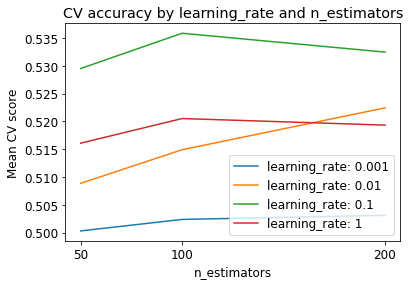

In [59]:
scores = np.array(scores).reshape(len(params3['learning_rate']), len(params3['n_estimators']))

for ind, i in enumerate(params3['learning_rate']):
    plt.plot(params3['n_estimators'], scores[ind], label='learning_rate: ' + str(i))
plt.legend()
plt.xlabel('n_estimators')
plt.ylabel('Mean CV score')
plt.title('CV accuracy by learning_rate and n_estimators')
plt.xticks(params3['n_estimators'], params3['n_estimators'])
plt.show()

In [60]:
optimised_xgbc = XGBClassifier(n_estimators = 100, learning_rate = 0.1)
print("CV Accuracy: %.2f%%" % (np.mean(cross_val_score(optimised_xgbc, X_train_std, y_train, cv=10)) * 100.0))
print("Out-of-sample Accuracy: %.2f%%" % (optimised_xgbc.fit(X_train_std, y_train).score(X_test_std, y_test) * 100.0))

CV Accuracy: 53.42%
Out-of-sample Accuracy: 54.97%


##### Fit the classifier on the whole training set

In [61]:
%%time
optimised_xgbc.fit(X_std, y)

CPU times: user 11.1 s, sys: 0 ns, total: 11.1 s
Wall time: 11.1 s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

### Stacked models

In [62]:
## the default meta_model is linear
stack_clf5 = stack_models(top[:5])
## predict on my test data
predict_model(stack_clf5);

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5531,0.8012,0.5638,0.5564,0.5532,0.4026,0.4034
1,0.5855,0.8278,0.5859,0.6003,0.5905,0.4467,0.4480
2,0.5487,0.7997,0.5524,0.5560,0.5517,0.3970,0.3973
3,0.5634,0.8067,0.5610,0.5798,0.5697,0.4184,0.4194
4,0.5442,0.8015,0.5432,0.5565,0.5478,0.3908,0.3923
5,0.5310,0.7941,0.5330,0.5440,0.5359,0.3724,0.3731
6,0.5081,0.7776,0.5116,0.5162,0.5113,0.3434,0.3438
7,0.5377,0.8051,0.5380,0.5438,0.5399,0.3827,0.3832
8,0.5628,0.8084,0.5615,0.5706,0.5656,0.4174,0.4179
9,0.5672,0.8122,0.5678,0.5706,0.5683,0.4221,0.4225


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Stacking Classifier,0.5590,0.8080,0.5583,0.5720,0.5641,0.4122,0.4128


In [63]:
## the default meta_model is linear
stack_clf7 = stack_models(top[:7])
## predict on my test data
predict_model(stack_clf7);

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5619,0.8011,0.5716,0.5675,0.5629,0.4141,0.4150
1,0.5782,0.8301,0.5784,0.5958,0.5839,0.4369,0.4386
2,0.5442,0.8012,0.5483,0.5540,0.5480,0.3912,0.3916
3,0.5752,0.8075,0.5724,0.5895,0.5809,0.4340,0.4348
4,0.5324,0.8027,0.5323,0.5419,0.5355,0.3752,0.3762
5,0.5339,0.7973,0.5369,0.5483,0.5390,0.3766,0.3775
6,0.5037,0.7782,0.5072,0.5087,0.5058,0.3377,0.3378
7,0.5391,0.8046,0.5392,0.5450,0.5415,0.3844,0.3846
8,0.5628,0.8084,0.5617,0.5704,0.5655,0.4173,0.4179
9,0.5687,0.8128,0.5707,0.5694,0.5682,0.4241,0.4247


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Stacking Classifier,0.5608,0.8097,0.5599,0.5744,0.5661,0.4144,0.4152


In [64]:
## the default meta_model is linear
stack_clf10 = stack_models(top[:10])
## predict on my test data
predict_model(stack_clf10);

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5678,0.8023,0.5772,0.5741,0.5688,0.4222,0.4234
1,0.5870,0.8294,0.5873,0.6010,0.5921,0.4486,0.4497
2,0.5546,0.8026,0.5585,0.5637,0.5579,0.4050,0.4056
3,0.5752,0.8058,0.5720,0.5895,0.5809,0.4338,0.4345
4,0.5369,0.8037,0.5360,0.5461,0.5394,0.3810,0.3821
5,0.5442,0.8000,0.5489,0.5570,0.5486,0.3905,0.3914
6,0.5111,0.7809,0.5146,0.5185,0.5140,0.3474,0.3477
7,0.5391,0.8044,0.5383,0.5433,0.5409,0.3841,0.3842
8,0.5672,0.8096,0.5661,0.5740,0.5697,0.4232,0.4236
9,0.5775,0.8151,0.5792,0.5784,0.5774,0.4358,0.4361


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Stacking Classifier,0.5597,0.8102,0.5589,0.5712,0.5643,0.4131,0.4136


## Predict on the test set

In [65]:
test = pd.read_csv('data/test.csv', index_col = 0)

In [66]:
## remove `is_business_travel_ready`
test_df = test.drop(['is_business_travel_ready'], 1)

# host_since
test_df.host_since = pd.to_datetime(test_df.host_since) 
test_df['host_days_active'] = (datetime(2020, 11, 5) - test_df.host_since).astype('timedelta64[D]')
test_df = test_df.drop('host_since', 1)

# last_review
test_df.last_review = pd.to_datetime(test_df.last_review)
test_df['time_since_last_review'] = (datetime(2020, 11, 5) -test_df.last_review).astype('timedelta64[D]')
test_df = test_df.drop('last_review', 1)

# cancellation_policy
test_df['cancellation_policy'].value_counts()
test_df.cancellation_policy.replace({
    'super_strict_30': 'strict_14_with_grace_period',
    'super_strict_60': 'strict_14_with_grace_period'
    }, inplace=True)

## bed_type
test_df.loc[~test_df.bed_type.isin(bed_keep), 'bed_type'] = 'other'

## neighbourhood
test_df.loc[~test_df.neighbourhood.isin(keep), 'neighbourhood'] = 'other'

## require_guest_profile_picture
test_df = test_df.drop(['require_guest_profile_picture'], 1)

## instant_bookable
test_df = test_df.drop('instant_bookable', 1)

## number_of_reviews
#test_df = test_df.drop('number_of_reviews', 1)

In [67]:
XXX_test = test_df

In [68]:
## standardize data
XX_test_categorical = pd.get_dummies(XXX_test[categorical])
scaler = StandardScaler()
XX_test_numeric_std = pd.DataFrame(data=scaler.fit_transform(XXX_test[numeric]), columns=numeric, index = XX_test_categorical.index)
XX_test_std = pd.concat([XX_test_numeric_std, XX_test_categorical], axis=1, sort=False)

In [69]:
## check number of features
len(XX_test_std.columns), len(X_std.columns)

(64, 64)

In [70]:
y_pred0 = optimised_random_forest.predict(XX_test_std)

In [71]:
y_pred1 = optimised_gradient_boosting.predict(XX_test_std)

In [72]:
y_pred2 = optimised_xgbc.predict(XX_test_std)

In [81]:
y_pred3 = predict_model(stack_clf5, data = XX_test_std)['Label']

In [82]:
y_pred4 = [p for p in predict_model(stack_clf7, data = XX_test_std)['Label']]

In [83]:
y_pred5 = [p for p in predict_model(stack_clf10, data = XX_test_std)['Label']]

In [90]:
sample = pd.read_csv('data/sample_submission.csv', index_col = 0)

In [101]:
sample.price = y_pred5

In [102]:
sample.to_csv('stack10.csv', index = True)

## Plot and Evaluate the model

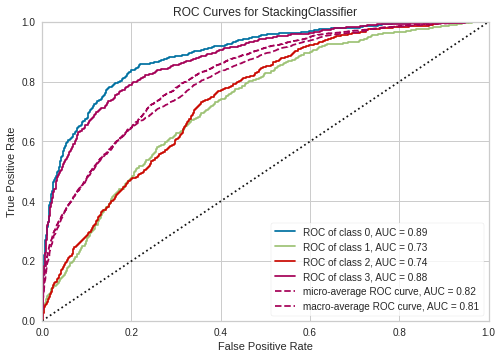

In [111]:
plot_model(stack_clf7)

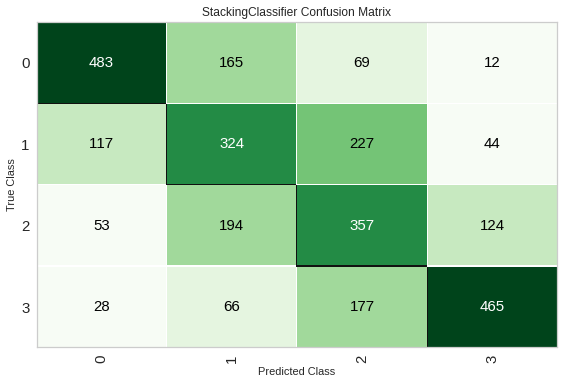

In [112]:
plot_model(stack_clf7, 'confusion_matrix')

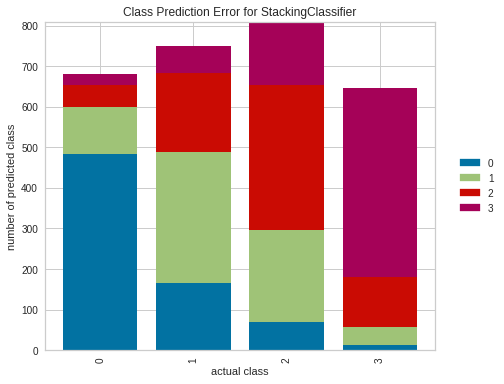

In [113]:
plot_model(stack_clf7, 'error')

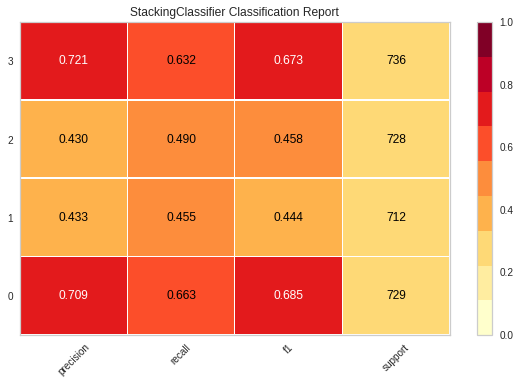

In [114]:
plot_model(stack_clf7, 'class_report')